In [1]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(randomForest))
suppressMessages(library(harmony))
options(future.globals.maxSize= 891289600 * 160)
# Plot each clusters
myHighlightDimPlot = function(seuratObj, highlightBy, size=1, alpha=1, showAllPoints=FALSE, ...) {
    umapTb = as_tibble(seuratObj@reductions$umap@cell.embeddings)
    if (!identical(rownames(seuratObj@reductions$umap@cell.embeddings), rownames(seuratObj@meta.data)))
        stop("Error: cell names not identical!")
    umapTb = cbind(umapTb, seuratObj@meta.data)
    highlightByClass = sort(unique(umapTb[[highlightBy]]))
    gpList = lapply(highlightByClass, function(cl) {
        subUmapTb = subset(umapTb, umapTb[[highlightBy]] == cl)
        if (showAllPoints) {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void() 
        } else {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void()
        }
        return(gp)
    })
    gpAll = plot_grid(plotlist=gpList, labels=highlightByClass, ...)
    return(gpAll)
}

In [2]:
print(1)

[1] 1


In [3]:
outDir='/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/3species_compare_240130/GNB4/'
marmoset_sub=readRDS(paste0(outDir,'marmoset_GNB4.rds'))
mouse_sub=readRDS(paste0(outDir,'mouse_GNB4.rds'))
macaque_sub=readRDS(paste0(outDir,'macaque_GNB4.rds'))


In [4]:
#macaque
macaque_sum=33872+78944+9190
#marmoset
marmoset_sum=22470+44443+11484
#mouse
mouse_sum=62398+21942+69205 


In [5]:
df=as.data.frame(table(marmoset_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/marmoset_sum
df

Var1,Freq,ratio,ratio_all
<fct>,<int>,<dbl>,<dbl>
GLUT_GNB4+_0,9242,0.20795176,0.117887164
GLUT_GNB4+_1,9039,0.20338411,0.115297779
GLUT_GNB4+_15,1028,0.02313075,0.013112747
GLUT_GNB4+_17,921,0.02072317,0.011747899
GLUT_GNB4+_18,757,0.01703305,0.009655982
GLUT_GNB4+_2,8693,0.19559886,0.110884345
GLUT_GNB4+_4,6282,0.14134959,0.080130617
GLUT_GNB4+_7,5117,0.11513624,0.065270355
GLUT_GNB4+_8,3364,0.07569246,0.042909805


In [6]:
df=as.data.frame(table(macaque_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/macaque_sum
df1=df
df1$species='macaque'
df1$type='special'
df1[df1$Var1 %in% c('GLUT_GNB4+_3',
                   'GLUT_GNB4+_13',
                   'GLUT_GNB4+_11',
                   'GLUT_GNB4+_16'),]$type='un_special'
df1

Var1,Freq,ratio,ratio_all,species,type
<fct>,<int>,<dbl>,<dbl>,<chr>,<chr>
GLUT_GNB4+_0,10655,0.13496909,0.08733177,macaque,special
GLUT_GNB4+_1,9178,0.11625963,0.07522581,macaque,special
GLUT_GNB4+_11,5334,0.06756688,0.04371916,macaque,un_special
GLUT_GNB4+_13,3832,0.04854074,0.03140829,macaque,un_special
GLUT_GNB4+_16,3150,0.03990170,0.02581840,macaque,un_special
GLUT_GNB4+_2,8241,0.10439045,0.06754586,macaque,special
GLUT_GNB4+_3,8224,0.10417511,0.06740652,macaque,un_special
GLUT_GNB4+_4,8191,0.10375709,0.06713604,macaque,special
GLUT_GNB4+_5,8137,0.10307306,0.06669344,macaque,special


In [7]:
sum(df1$Freq)

[1] 78944

In [8]:
10655+9178+6998
8241+7004
8191+8137

[1] 26831

[1] 15245

[1] 16328

In [9]:
26831/78944
15245/78944
16328/78944

[1] 0.3398738

[1] 0.1931116

[1] 0.2068302

In [10]:
df=as.data.frame(table(mouse_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/mouse_sum
df2=df
df2$species='mouse'
df2$type='un_special'


In [11]:
df_bili=rbind(df1,df2)
df_bili$name=paste0(df_bili$species,' ',df_bili$Var1)

col_d=c(colorRampPalette(c("#053061", "#D1E5F0"))(8)[1:7],
colorRampPalette(c("#67001F", "#FDDBC7"))(8)[1:7])
name=df_bili[order(df_bili$type,decreasing = T),]$name
names(col_d)=name
df_bili$name=factor(df_bili$name,levels = name)

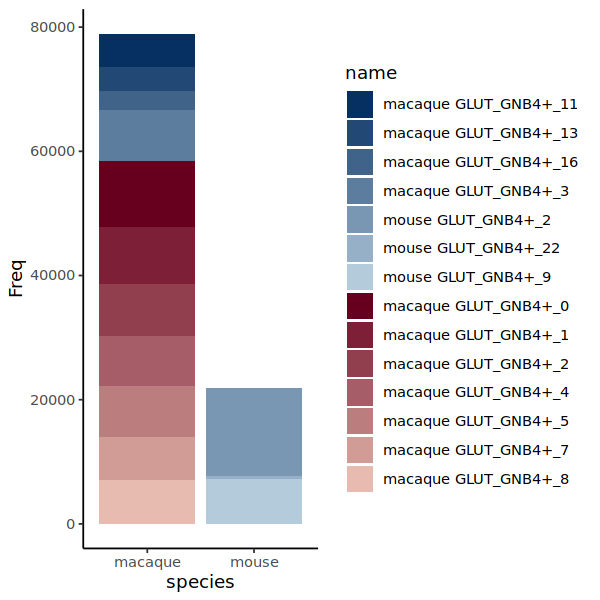

In [12]:
options(repr.plot.width=5, repr.plot.height=5)
p1=ggplot(data = df_bili, aes(x = species, y = Freq, fill = name)) +
scale_fill_manual(values =col_d)+
 geom_bar(stat = "identity", position = "stack")+theme_classic()
#+
 #theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
p1


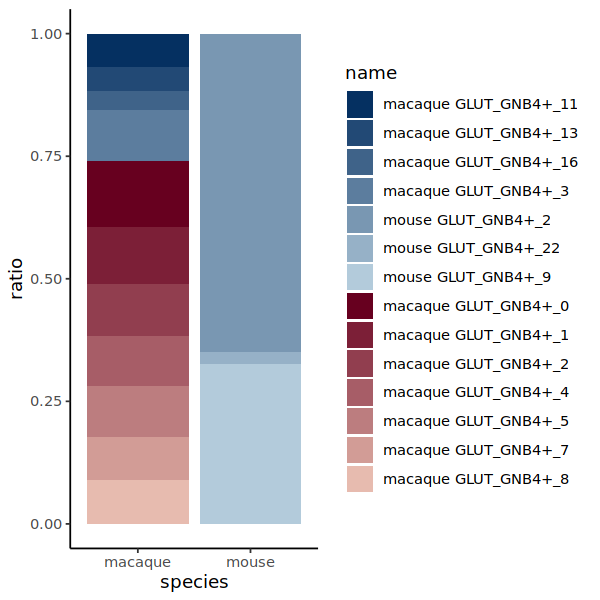

In [13]:
options(repr.plot.width=5, repr.plot.height=5)
p1=ggplot(data = df_bili, aes(x = species, y = ratio, fill = name)) +
scale_fill_manual(values =col_d)+
 geom_bar(stat = "identity", position = "stack")+theme_classic()
#+
 #theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
p1


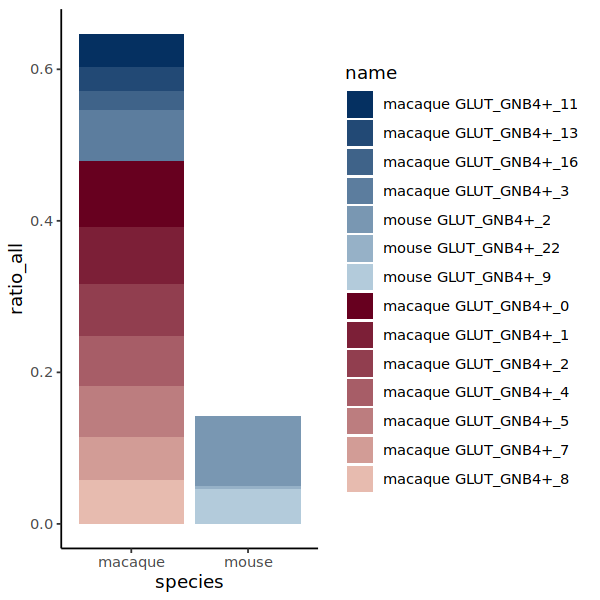

In [14]:
options(repr.plot.width=5, repr.plot.height=5)
p1=ggplot(data = df_bili, aes(x = species, y = ratio_all, fill = name)) +
scale_fill_manual(values =col_d)+
 geom_bar(stat = "identity", position = "stack")+theme_classic()
#+
 #theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
p1


In [15]:
df=as.data.frame(table(macaque_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/macaque_sum
df1=df
df1$species='macaque'
df1$type='special'
df1[df1$Var1 %in% c('GLUT_GNB4+_3',
                    'GLUT_GNB4+_13',
                   'GLUT_GNB4+_11',
                   'GLUT_GNB4+_16'),]$type='un_special'
df1

Var1,Freq,ratio,ratio_all,species,type
<fct>,<int>,<dbl>,<dbl>,<chr>,<chr>
GLUT_GNB4+_0,10655,0.13496909,0.08733177,macaque,special
GLUT_GNB4+_1,9178,0.11625963,0.07522581,macaque,special
GLUT_GNB4+_11,5334,0.06756688,0.04371916,macaque,un_special
GLUT_GNB4+_13,3832,0.04854074,0.03140829,macaque,un_special
GLUT_GNB4+_16,3150,0.03990170,0.02581840,macaque,un_special
GLUT_GNB4+_2,8241,0.10439045,0.06754586,macaque,special
GLUT_GNB4+_3,8224,0.10417511,0.06740652,macaque,un_special
GLUT_GNB4+_4,8191,0.10375709,0.06713604,macaque,special
GLUT_GNB4+_5,8137,0.10307306,0.06669344,macaque,special


In [16]:
df=as.data.frame(table(mouse_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/mouse_sum
df2=df
df2$species='mouse'
df2$type='un_special'
df2


Var1,Freq,ratio,ratio_all,species,type
<fct>,<int>,<dbl>,<dbl>,<chr>,<chr>
GLUT_GNB4+_2,14270,0.6503509,0.092936924,mouse,un_special
GLUT_GNB4+_22,506,0.0230608,0.003295451,mouse,un_special
GLUT_GNB4+_9,7166,0.3265883,0.046670357,mouse,un_special


In [17]:
df=as.data.frame(table(marmoset_sub$Cluster))
df$ratio=df$Freq/sum(df$Freq)
df$ratio_all=df$Freq/marmoset_sum
df3=df
df3$species='marmoset'
df3$type='special'
df3[df3$Var1 %in% c(
                   'GLUT_GNB4+_8'),]$type='un_special'
df3[df3$Var1 %in% c(
                   'GLUT_GNB4+_0','GLUT_GNB4+_7'),]$type='222'
df3


Var1,Freq,ratio,ratio_all,species,type
<fct>,<int>,<dbl>,<dbl>,<chr>,<chr>
GLUT_GNB4+_0,9242,0.20795176,0.117887164,marmoset,222
GLUT_GNB4+_1,9039,0.20338411,0.115297779,marmoset,special
GLUT_GNB4+_15,1028,0.02313075,0.013112747,marmoset,special
GLUT_GNB4+_17,921,0.02072317,0.011747899,marmoset,special
GLUT_GNB4+_18,757,0.01703305,0.009655982,marmoset,special
GLUT_GNB4+_2,8693,0.19559886,0.110884345,marmoset,special
GLUT_GNB4+_4,6282,0.14134959,0.080130617,marmoset,special
GLUT_GNB4+_7,5117,0.11513624,0.065270355,marmoset,222
GLUT_GNB4+_8,3364,0.07569246,0.042909805,marmoset,un_special


In [18]:
df_bili=rbind(df1,df3,df2)
df_bili$name=paste0(df_bili$species,' ',df_bili$Var1)

spe_n=nrow(df_bili[df_bili$type=='special',])
un_spe_n=nrow(df_bili[df_bili$type=='un_special',])
n_222=nrow(df_bili[df_bili$type=='222',])

col_d=c(colorRampPalette(c("#053061", "#D1E5F0"))(20)[1:un_spe_n],
colorRampPalette(c("#67001F", "#FDDBC7"))(20)[1:spe_n],
       colorRampPalette(c("darkgreen", "green"))(3)[1:n_222])
name=df_bili[order(df_bili$type,decreasing = T),]$name
names(col_d)=name
df_bili$name=factor(df_bili$name,levels = name)



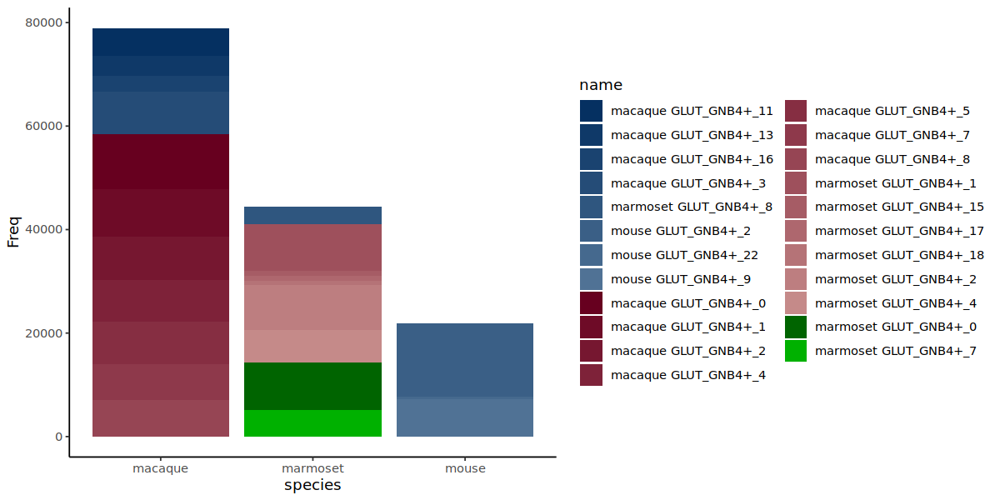

In [19]:
options(repr.plot.width=10, repr.plot.height=5)
p1=ggplot(data = df_bili, aes(x = species, y = Freq, fill = name)) +
scale_fill_manual(values =col_d)+
 geom_bar(stat = "identity", position = "stack")+theme_classic()
#+
 #theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
p1

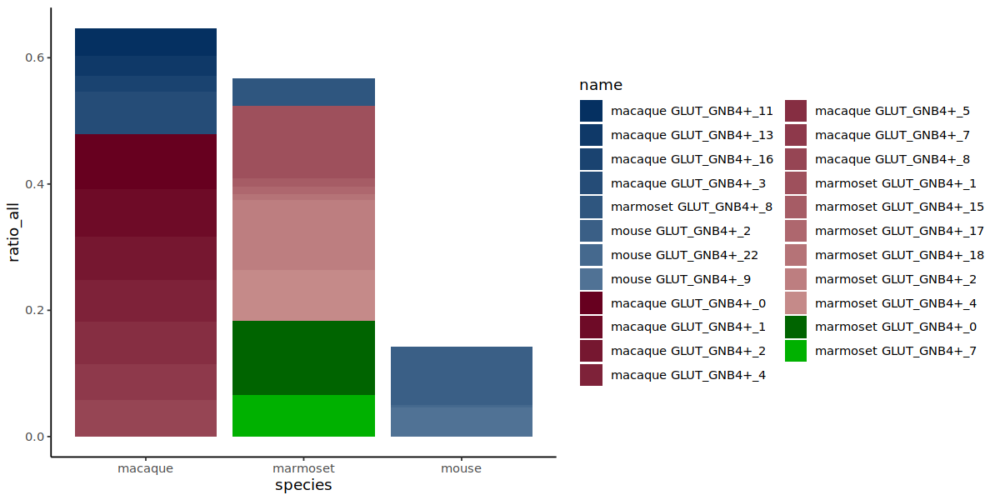

In [20]:
options(repr.plot.width=10, repr.plot.height=5)
p1=ggplot(data = df_bili, aes(x = species, y = ratio_all, fill = name)) +
scale_fill_manual(values =col_d)+
 geom_bar(stat = "identity", position = "stack")+theme_classic()
#+
 #theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))
p1


In [36]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_marmo_bili.pdf", width=10, height=5)
p1
dev.off()

png 
  2

In [65]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_bili.pdf", width=5, height=5)
p1
dev.off()


png 
  2

In [21]:
marmoset=marmoset_sub
mouse=mouse_sub
macaque=macaque_sub

test=read.table('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/3species_compare_240227_merge_anno/mart_export.txt',sep="\t",header=T)

comGeneTb = test[c("Marmoset.gene.name", "Gene.name", "Mouse.gene.name")]
colnames(comGeneTb)=c('marmosetGene','macaqueGene','mouseGene')
comGeneTb=comGeneTb[grep('[A-Za-z]',comGeneTb$marmosetGene),]
comGeneTb=comGeneTb[grep('[A-Za-z]',comGeneTb$macaqueGene),]
comGeneTb=comGeneTb[grep('[A-Za-z]',comGeneTb$mouseGene),]
prepareHomoSeurat = function(seurat, originalGeneName, homoGeneName, keepMetaCol, commonMetaCol, speciesPrefix="macaque_", clusterCol="anno3") {
    homoCountMx = seurat[["RNA"]]@counts[originalGeneName,]
    rownames(homoCountMx) = homoGeneName
    colnames(homoCountMx) = paste0(speciesPrefix, colnames(homoCountMx))
    homoSeurat = CreateSeuratObject(counts=homoCountMx)
    tmpDf = seurat@meta.data[sub(speciesPrefix, "", rownames(homoSeurat@meta.data)), keepMetaCol]
    tmpDf$species = sub("(_|-)", "", speciesPrefix)
    tmpDf$clusterName = paste0(speciesPrefix, tmpDf[[clusterCol]])
    commonMetaCol = c(commonMetaCol, "species", "clusterName")
    colnames(tmpDf) = ifelse(
        colnames(tmpDf) %in% commonMetaCol, colnames(tmpDf),
        paste0(speciesPrefix, colnames(tmpDf))
    )
    rownames(tmpDf) = paste0(speciesPrefix, rownames(tmpDf))
    homoSeurat = AddMetaData(homoSeurat, metadata=tmpDf)
    return(homoSeurat)
}

comGeneTb$homoGeneSymbol = comGeneTb$macaqueGene
comGeneTb = subset(
    comGeneTb, 
    marmosetGene %in% rownames(marmoset[["RNA"]]@counts) & 
    macaqueGene %in% rownames(macaque[["RNA"]]@counts) &
    mouseGene %in% rownames(mouse[["RNA"]]@counts)
)

macaque$sample=macaque$donor2


macaqueHomoSeurat = prepareHomoSeurat(
    macaque, originalGeneName=comGeneTb$macaqueGene, homoGeneName=comGeneTb$homoGeneSymbol,
    keepMetaCol=c("nCount_RNA", "nFeature_RNA",'percent.mt','SuperCluster','Cluster','sample'),
    commonMetaCol=c("nCount_RNA", "nFeature_RNA"),
    speciesPrefix="macaque_", clusterCol="Cluster"
)

macaque
macaqueHomoSeurat

marmosetHomoSeurat = prepareHomoSeurat(
    marmoset, originalGeneName=comGeneTb$marmosetGene, homoGeneName=comGeneTb$homoGeneSymbol,
    keepMetaCol=c("nCount_RNA",'percent.mt', "nFeature_RNA",'SuperCluster','Cluster','sample'),
    commonMetaCol=c("nCount_RNA", "nFeature_RNA"),
    speciesPrefix="marmoset_", clusterCol="Cluster"
)

marmoset
marmosetHomoSeurat


mouseHomoSeurat = prepareHomoSeurat(
    mouse, originalGeneName=comGeneTb$mouseGene, homoGeneName=comGeneTb$homoGeneSymbol,
    keepMetaCol=c("nCount_RNA",'percent.mt', "nFeature_RNA",'SuperCluster','Cluster','sample'),
    commonMetaCol=c("nCount_RNA", "nFeature_RNA"),
    speciesPrefix="mouse_", clusterCol="Cluster"
)

mouse
mouseHomoSeurat

mouseHomoSeurat$species='mouse'
marmosetHomoSeurat$species='marmoset'
macaqueHomoSeurat$species='macaque'


An object of class Seurat 
43267 features across 78944 samples within 2 assays 
Active assay: SCT (21304 features, 21304 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

An object of class Seurat 
13429 features across 78944 samples within 1 assay 
Active assay: RNA (13429 features, 0 variable features)

An object of class Seurat 
63792 features across 44443 samples within 2 assays 
Active assay: SCT (30873 features, 30873 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

An object of class Seurat 
13429 features across 44443 samples within 1 assay 
Active assay: RNA (13429 features, 0 variable features)

An object of class Seurat 
91564 features across 21942 samples within 2 assays 
Active assay: SCT (42856 features, 42856 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

An object of class Seurat 
13429 features across 21942 samples within 1 assay 
Active assay: RNA (13429 features, 0 variable features)

In [ ]:
merge1=merge(mouseHomoSeurat,marmosetHomoSeurat)
merge2=merge(merge1,macaqueHomoSeurat)

classFiltSeurat=merge2
classFiltSeurat = SCTransform(
classFiltSeurat, assay="RNA",
ncells=ncol(classFiltSeurat[["RNA"]]),
variable.features.n=5000,
#return.only.var.genes = T,
#vars.to.regress="percent.mt",
method="glmGamPoi"
)
classFiltSeurat = classFiltSeurat %>%
RunPCA(npcs=100, verbose = FALSE) %>%
FindNeighbors(dims = 1:50) %>%
FindClusters(verbose = FALSE) %>%
RunUMAP(dims = 1:50)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 13401 by 145329

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 145329 cells



  |                                                                      |   0%

In [ ]:
myHighlightDimPlot = function(seuratObj, highlightBy, size=1, alpha=1, showAllPoints=FALSE, ...) {
    umapTb = as_tibble(seuratObj@reductions$umap@cell.embeddings)
    if (!identical(rownames(seuratObj@reductions$umap@cell.embeddings), rownames(seuratObj@meta.data)))
        stop("Error: cell names not identical!")
    umapTb = cbind(umapTb, seuratObj@meta.data)
    highlightByClass = sort(unique(umapTb[[highlightBy]]))
    gpList = lapply(highlightByClass, function(cl) {
        subUmapTb = subset(umapTb, umapTb[[highlightBy]] == cl)
        if (showAllPoints) {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void() 
        } else {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void()
        }
        return(gp)
    })
    gpAll = plot_grid(plotlist=gpList, ...)
    return(gpAll)
}
options(repr.plot.width=7, repr.plot.height=7)
myHighlightDimPlot(classFiltSeurat, highlightBy="species", showAllPoints=T, size=0.1)


classMarkerTop = c('LHX6','LAMP5','PROX1','ADARB2','NR2F2')

options(repr.plot.width=10, repr.plot.height=10)
FeaturePlot(classFiltSeurat, features = classMarkerTop,raster=FALSE)


In [ ]:

# Run harmony
DefaultAssay(classFiltSeurat) = "SCT"
options(repr.plot.width=6, repr.plot.height=2.5)
classFiltSeurat = RunHarmony(
classFiltSeurat, group.by.vars="species", plot_convergence=T,
assay.use="SCT", reduction = "pca", dims.use=1:10
)
classFiltSeurat = classFiltSeurat %>%
FindNeighbors(reduction="harmony", dims = 1:10) %>%
FindClusters(verbose = FALSE,resolution = 0.2) %>%
RunUMAP(reduction="harmony", dims = 1:10)
return(classFiltSeurat)


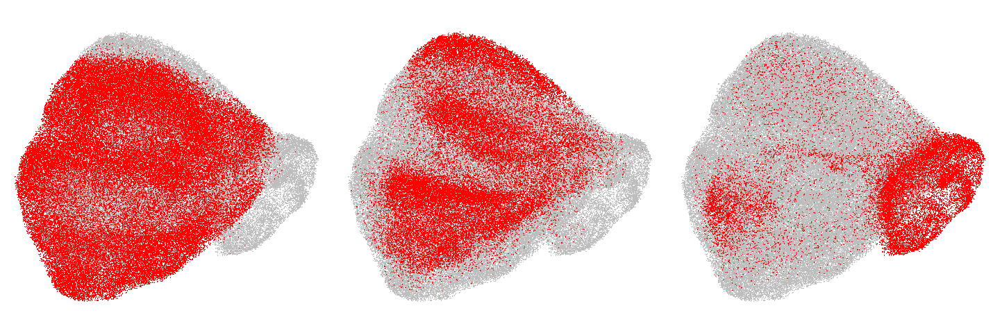

In [26]:
myHighlightDimPlot = function(seuratObj, highlightBy, size=1, alpha=1, showAllPoints=FALSE, ...) {
    umapTb = as_tibble(seuratObj@reductions$umap@cell.embeddings)
    if (!identical(rownames(seuratObj@reductions$umap@cell.embeddings), rownames(seuratObj@meta.data)))
        stop("Error: cell names not identical!")
    umapTb = cbind(umapTb, seuratObj@meta.data)
    highlightByClass = sort(unique(umapTb[[highlightBy]]))
    gpList = lapply(highlightByClass, function(cl) {
        subUmapTb = subset(umapTb, umapTb[[highlightBy]] == cl)
        if (showAllPoints) {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void() 
        } else {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void()
        }
        return(gp)
    })
    gpAll = plot_grid(plotlist=gpList, ...)
    return(gpAll)
}

options(repr.plot.width=12, repr.plot.height=4)
gp1=myHighlightDimPlot(classFiltSeurat, highlightBy="species", showAllPoints=T, size=0.1,nrow=1)
gp1

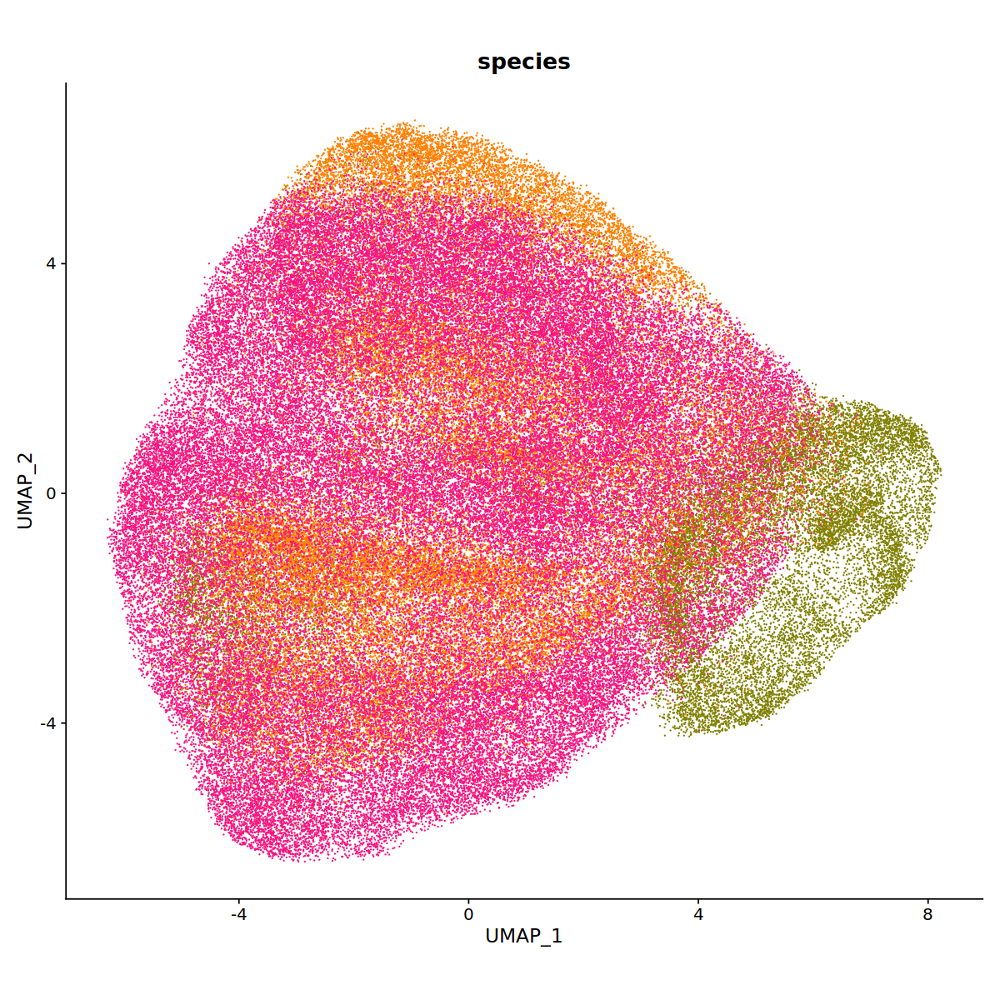

In [28]:
colorLeg = c("marmoset"="#FF8000", "macaque"="#F71480", "mouse"="#808000")

options(repr.plot.width=10, repr.plot.height=10)
gp2=DimPlot(classFiltSeurat, reduction="umap", group.by="species", cols = colorLeg,label=F,raster=FALSE)+coord_fixed()+NoLegend()
gp2


In [ ]:
colorLeg = c("marmoset"="#FF8000", "macaque"="#F71480", "mouse"="#808000")


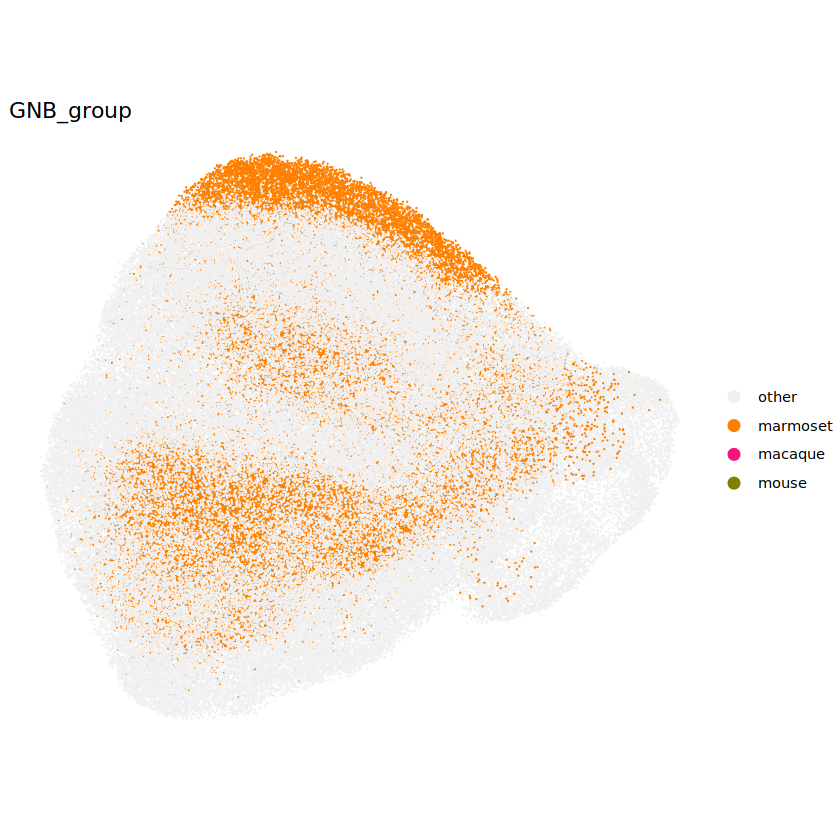

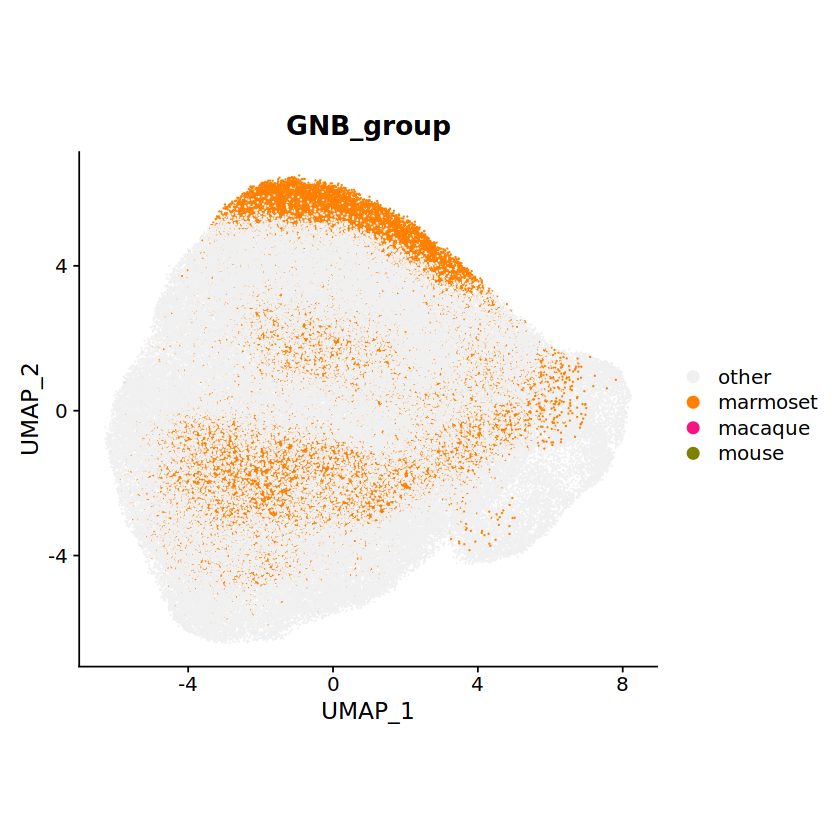

In [41]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('marmoset',unique(classFiltSeurat@meta.data$clusterNameMod))]
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('marmoset',classFiltSeurat@meta.data$clusterName),]$GNB_group='marmoset'

colorLeg1 = c("other"="#F0F0F0","marmoset"="#FF8000", "macaque"="#F71480", "mouse"="#808000")


options(repr.plot.width=7, repr.plot.height=7)
gp1_1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()+theme_void()
gp1_1

gp1_1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()
gp1_1



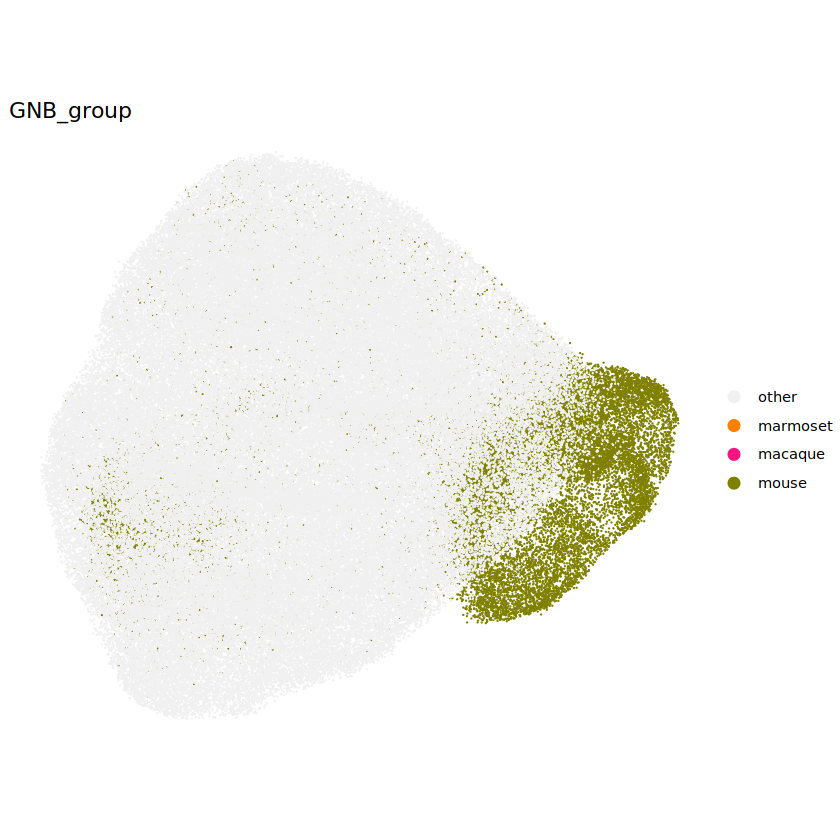

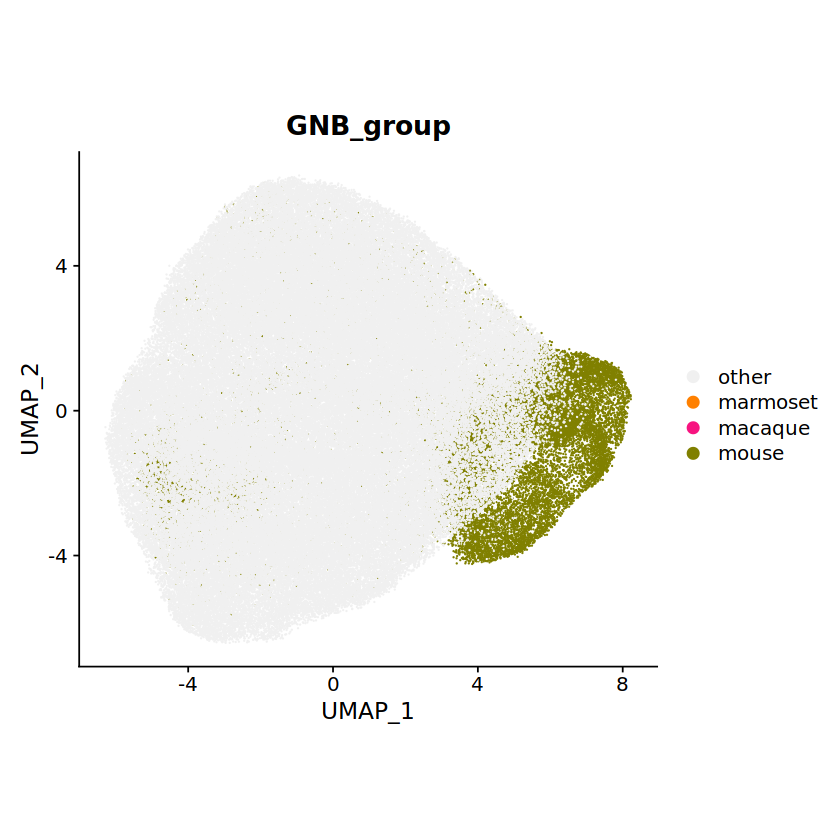

In [42]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('mouse',unique(classFiltSeurat@meta.data$clusterNameMod))]
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('mouse',classFiltSeurat@meta.data$clusterName),]$GNB_group='mouse'

colorLeg1 = c("other"="#F0F0F0","marmoset"="#FF8000", "macaque"="#F71480", "mouse"="#808000")


options(repr.plot.width=7, repr.plot.height=7)
gp1_2=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()+theme_void()
gp1_2

gp1_2=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()
gp1_2


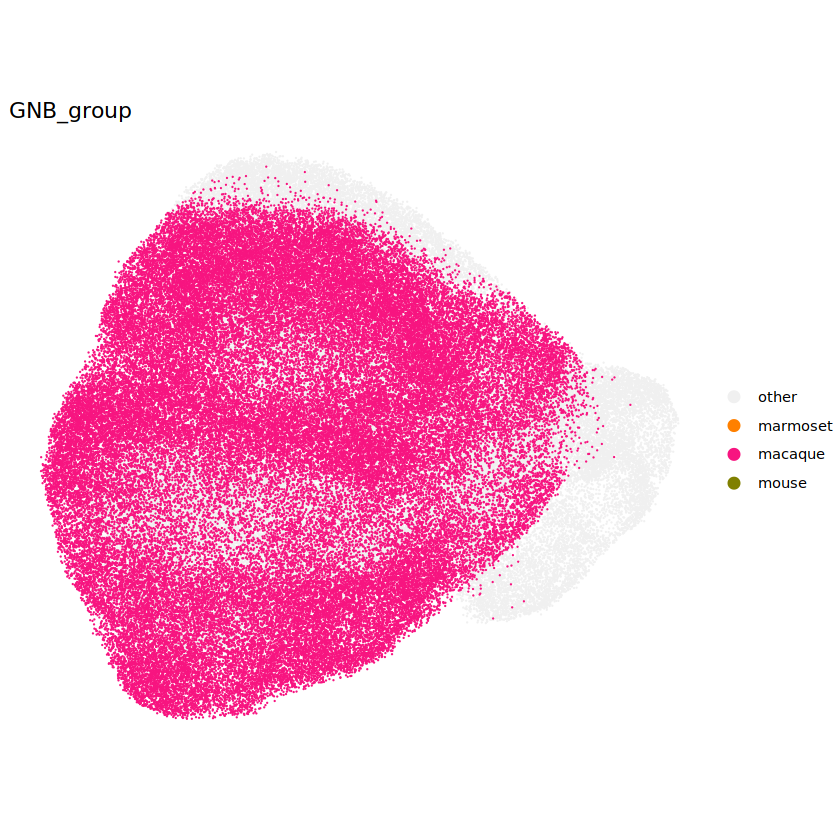

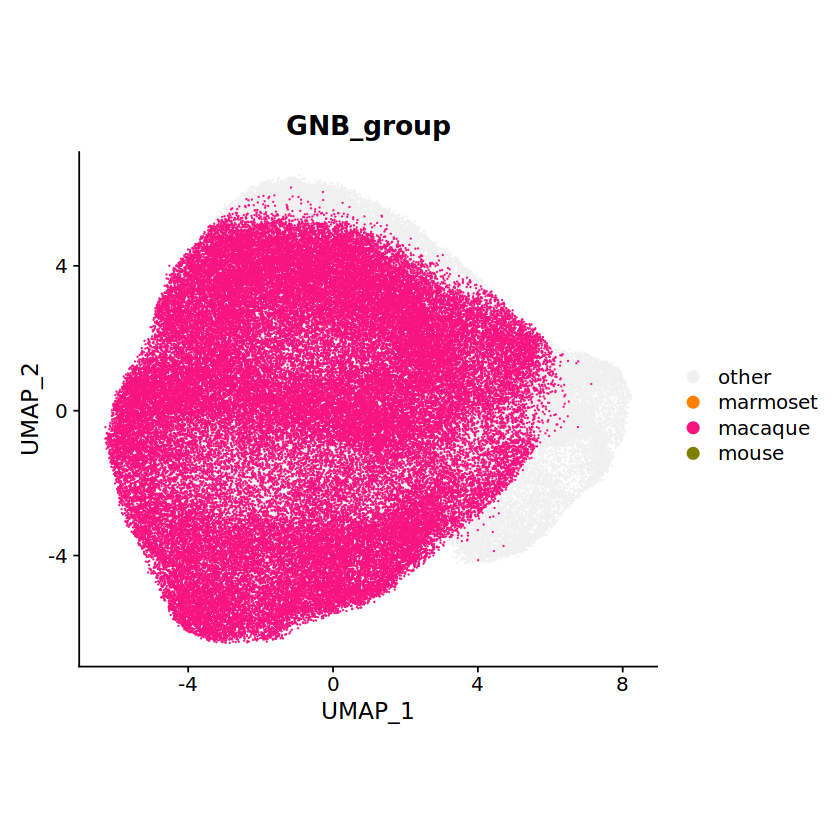

In [43]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('macaque',unique(classFiltSeurat@meta.data$clusterNameMod))]
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('macaque',classFiltSeurat@meta.data$clusterName),]$GNB_group='macaque'

colorLeg1 = c("other"="#F0F0F0","marmoset"="#FF8000", "macaque"="#F71480", "mouse"="#808000")
options(repr.plot.width=7, repr.plot.height=7)
gp1_3=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()+theme_void()
gp1_3


options(repr.plot.width=7, repr.plot.height=7)
gp1_3=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = colorLeg1)+coord_fixed()
gp1_3


In [40]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_umap1.pdf", width=7, height=7)
gp1_1
dev.off()
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_umap2.pdf", width=7, height=7)
gp1_2
dev.off()
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_umap3.pdf", width=7, height=7)
gp1_3
dev.off()
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb4_umap4.pdf", width=10, height=10)
gp2
dev.off()


png 
  2

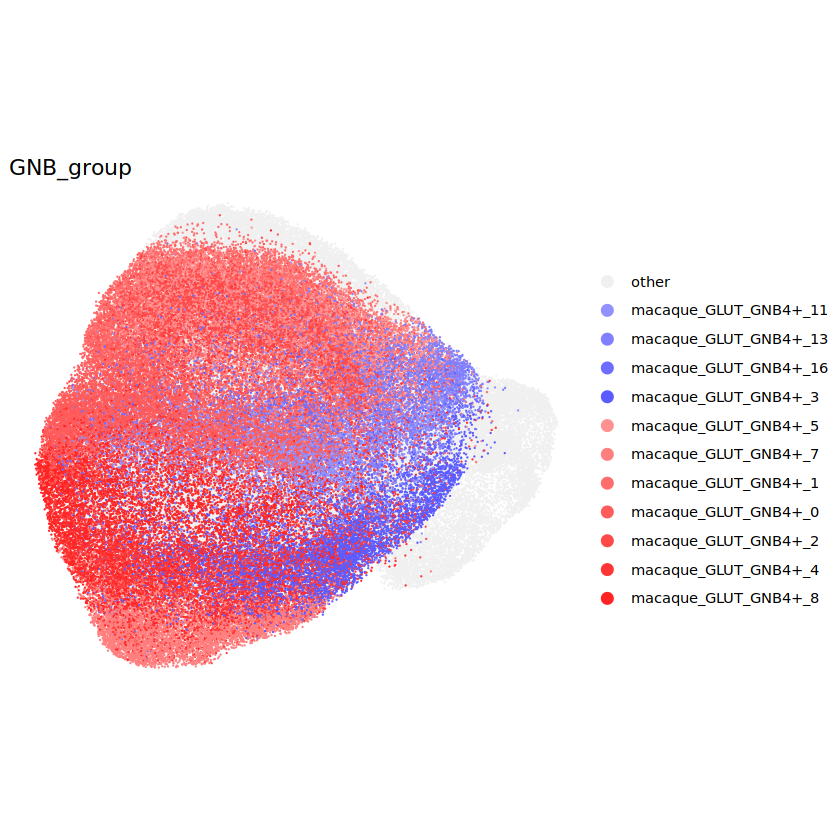

In [44]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('macaque',unique(classFiltSeurat@meta.data$clusterNameMod))]
sel_n=setdiff(sel_n,c('macaque_GLUT_GNB4+_11','macaque_GLUT_GNB4+_13','macaque_GLUT_GNB4+_16','macaque_GLUT_GNB4+_3'))
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('macaque',classFiltSeurat@meta.data$clusterName),]$GNB_group=classFiltSeurat@meta.data[grep('macaque',classFiltSeurat@meta.data$clusterName),]$clusterNameMod

col=c('#F0F0F0',colorRampPalette(c("white",'blue'))(15)[7:10],colorRampPalette(c("white",'red'))(15)[7:13])
names(col)=c('other','macaque_GLUT_GNB4+_11','macaque_GLUT_GNB4+_13','macaque_GLUT_GNB4+_16','macaque_GLUT_GNB4+_3',sel_n)

options(repr.plot.width=7, repr.plot.height=7)
gp1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()
gp1

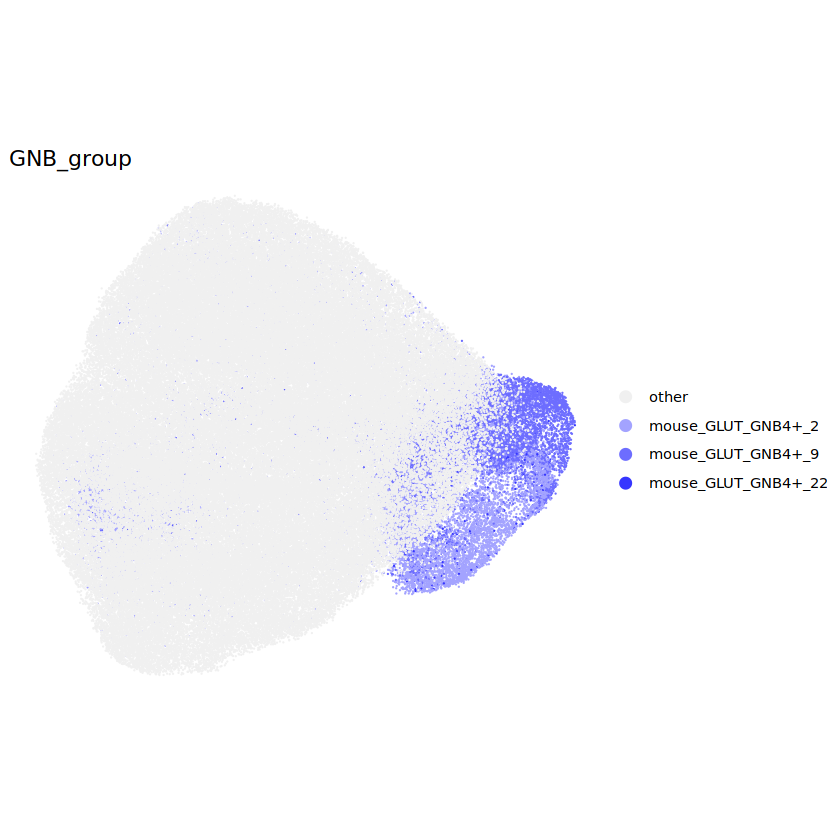

In [45]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('mouse',unique(classFiltSeurat@meta.data$clusterNameMod))]
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('mouse',classFiltSeurat@meta.data$clusterName),]$GNB_group=classFiltSeurat@meta.data[grep('mouse',classFiltSeurat@meta.data$clusterName),]$clusterNameMod

col=c('#F0F0F0',colorRampPalette(c("white",'blue'))(15)[c(6,9,12)])
names(col)=c('other',sel_n)

options(repr.plot.width=7, repr.plot.height=7)
gp2=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()
gp2

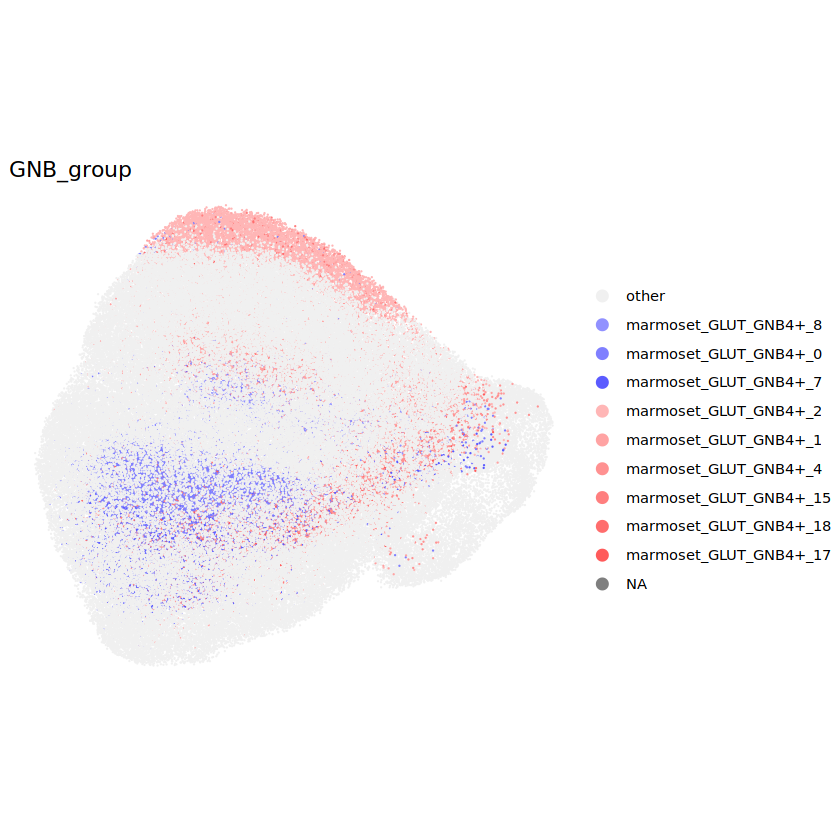

In [46]:
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('marmoset',unique(classFiltSeurat@meta.data$clusterNameMod))]
sel_n=setdiff(sel_n,c('marmoset_GLUT_GNB4+_8','marmoset_GLUT_GNB4+_0','marmoset_GLUT_GNB4+_7'))
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('marmoset',classFiltSeurat@meta.data$clusterName),]$GNB_group=classFiltSeurat@meta.data[grep('marmoset',classFiltSeurat@meta.data$clusterName),]$clusterNameMod

col=c('#F0F0F0',colorRampPalette(c("white",'blue'))(15)[7],colorRampPalette(c("white",'blue'))(15)[c(8,10)],colorRampPalette(c("white",'red'))(15)[5:12])
names(col)=c('other','marmoset_GLUT_GNB4+_8','marmoset_GLUT_GNB4+_0','marmoset_GLUT_GNB4+_7',sel_n)

options(repr.plot.width=7, repr.plot.height=7)
gp3=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()
gp3


In [47]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb_0415_1.pdf", width=7, height=7)
gp1
dev.off()

pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb_0415_2.pdf", width=7, height=7)
gp2
dev.off()

pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb_0415_3.pdf", width=7, height=7)
gp3
dev.off()


png 
  2

png 
  2

png 
  2

In [31]:
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('macaque',unique(classFiltSeurat@meta.data$clusterNameMod))]
sel_n=setdiff(sel_n,c('macaque_GLUT_GNB4+_13'))
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[grep('macaque',classFiltSeurat@meta.data$clusterName),]$GNB_group=classFiltSeurat@meta.data[grep('macaque',classFiltSeurat@meta.data$clusterName),]$clusterNameMod

col=c('#F0F0F0',colorRampPalette(c("white",'blue'))(15)[c(10)],colorRampPalette(c("white",'red'))(15)[4:13])
names(col)=c('other','macaque_GLUT_GNB4+_13',sel_n)

options(repr.plot.width=7, repr.plot.height=7)
gp1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()


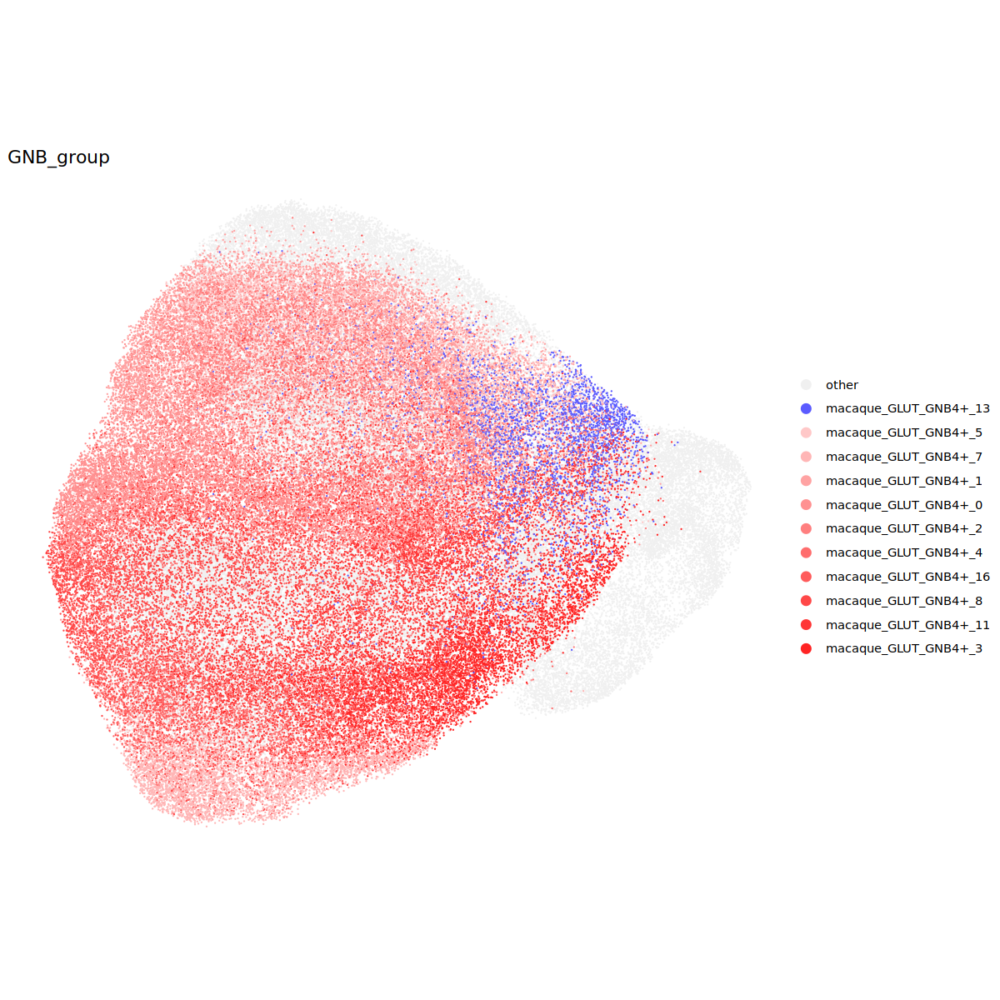

In [34]:
options(repr.plot.width=10, repr.plot.height=10)

gp1

In [33]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb_0325.pdf", width=5, height=5)
gp1
dev.off()

png 
  2

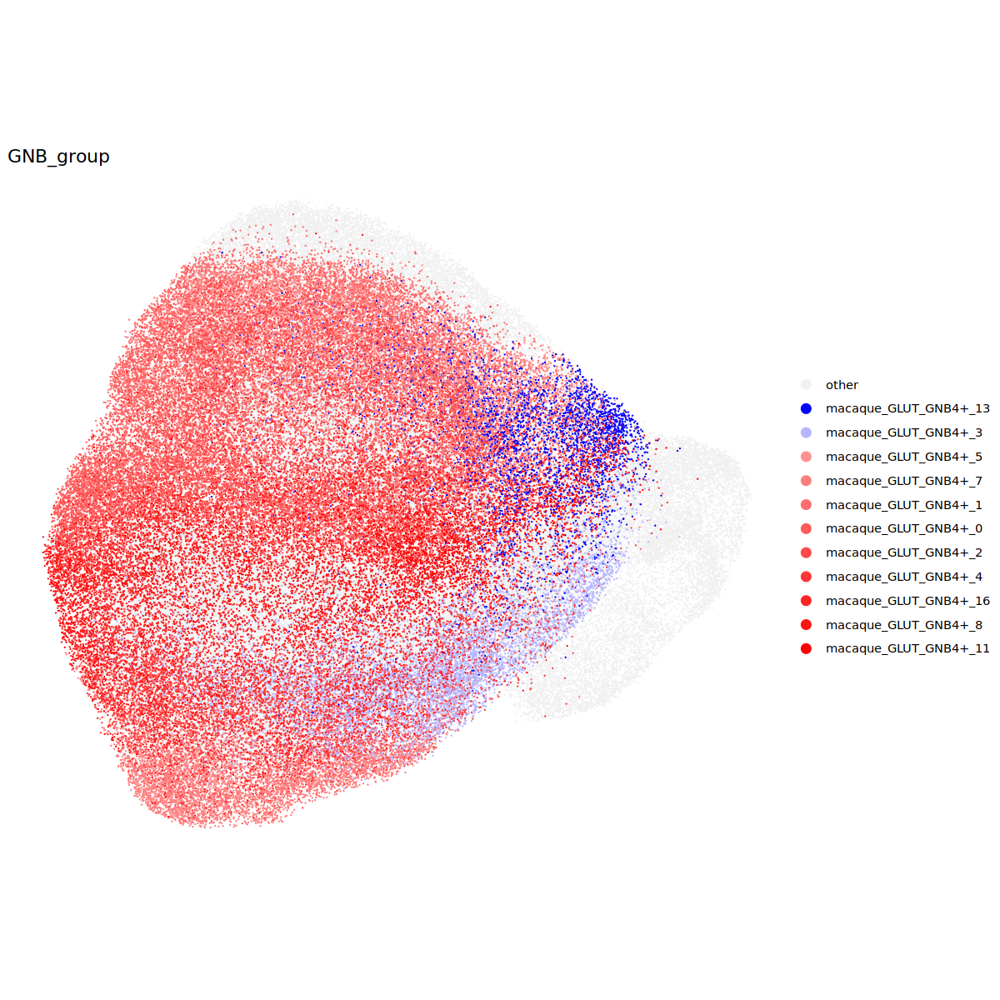

In [63]:
options(repr.plot.width=10, repr.plot.height=10)
gp1

In [62]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb_0325.pdf", width=5, height=5)
gp1
dev.off()



png 
  2

In [62]:

png("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/all_3species_gnb4.png", width=800, height=2200)
gp1
dev.off()


png 
  2

In [41]:
classFiltSeurat_raw=classFiltSeurat

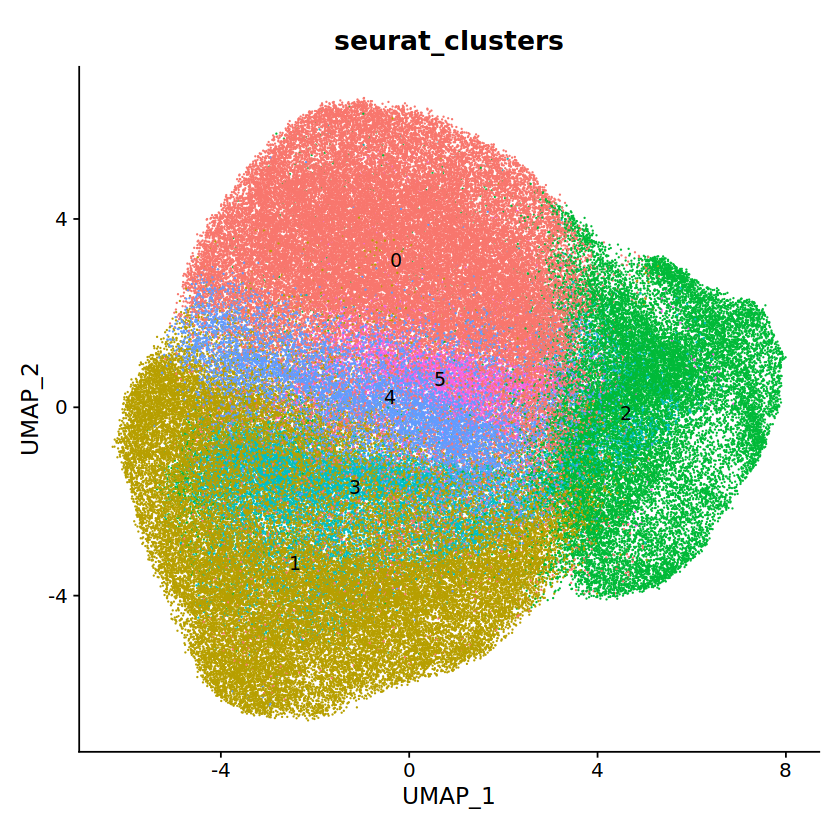

In [39]:

DimPlot(classFiltSeurat, reduction="umap", group.by="seurat_clusters",label=T,raster=FALSE)+coord_fixed()+NoLegend()


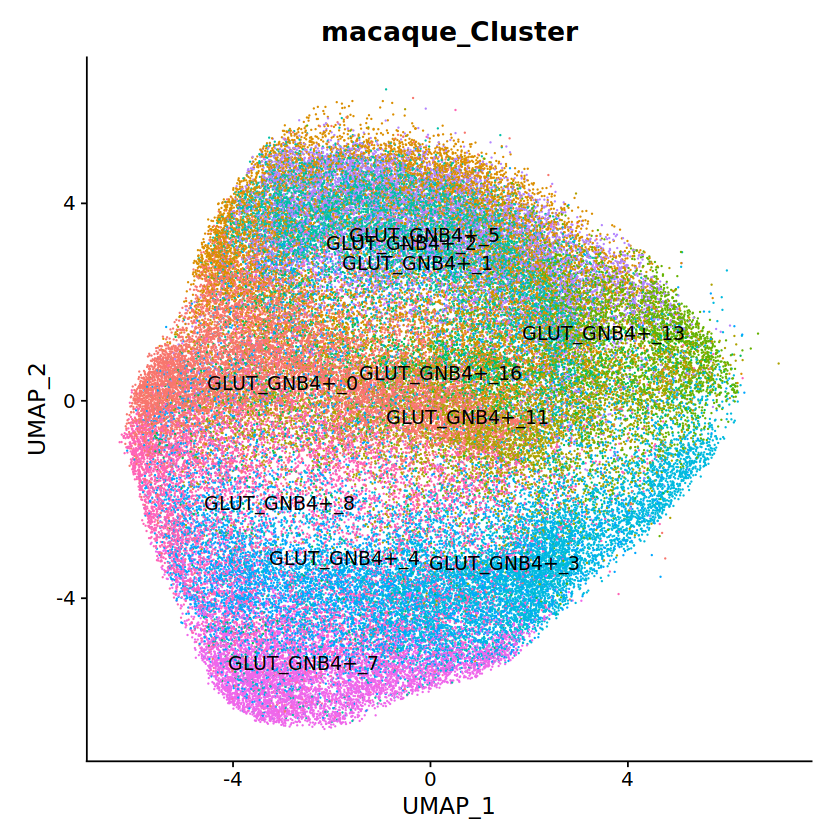

In [40]:
sub_classFiltSeurat1=subset(classFiltSeurat,species=='macaque')

DimPlot(sub_classFiltSeurat1, reduction="umap", group.by="macaque_Cluster",label=T,raster=FALSE)+coord_fixed()+NoLegend()



png 
  2

png 
  2

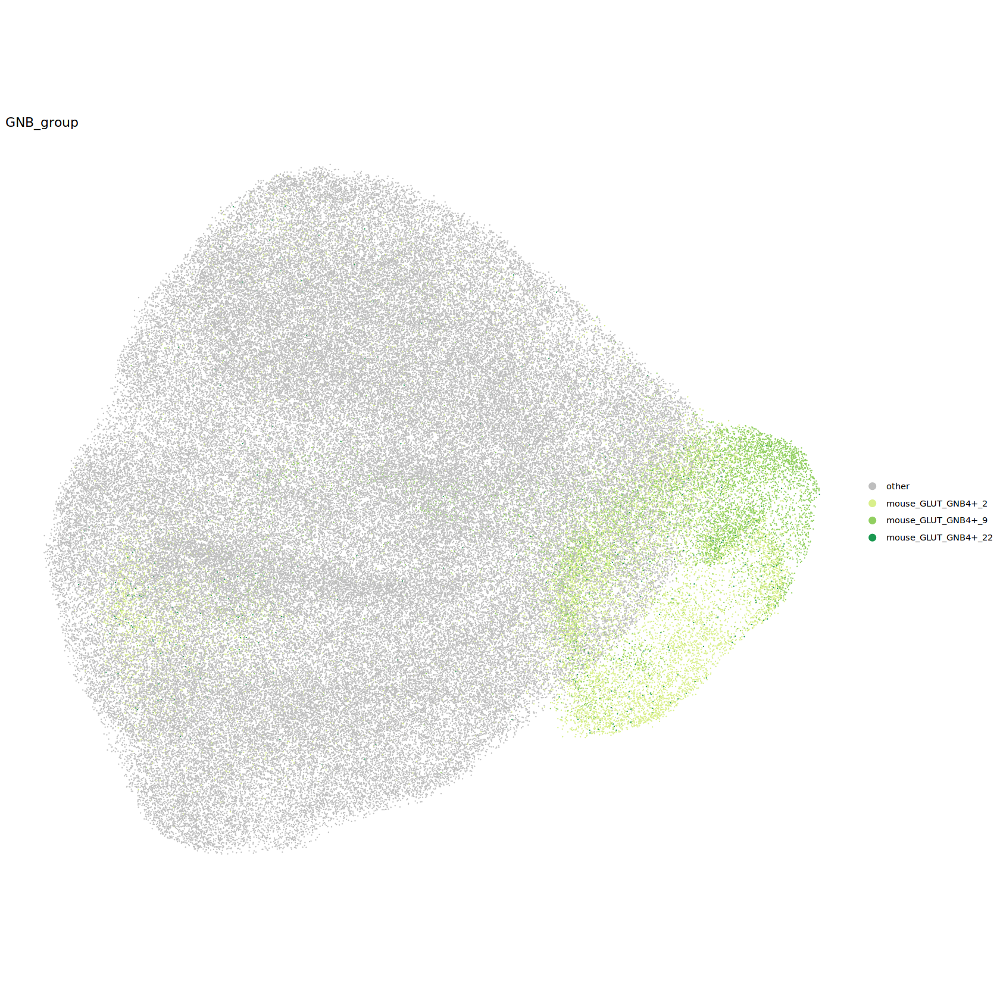

In [14]:
options(repr.plot.width=4, repr.plot.height=4)
classFiltSeurat$clusterNameMod=classFiltSeurat$clusterName
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% c('mouse_GLUT_GNB4+_2'),]$GNB_group='mouse_GLUT_GNB4+_2'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% c('mouse_GLUT_GNB4+_9'),]$GNB_group='mouse_GLUT_GNB4+_9'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% c('mouse_GLUT_GNB4+_22'),]$GNB_group='mouse_GLUT_GNB4+_22'

col=c('grey',brewer.pal(6,'RdYlGn')[4:6])
names(col)=c('other',paste0('mouse_',unique(classFiltSeurat@meta.data$mouse_Cluster)[1:3]))

options(repr.plot.width=14, repr.plot.height=14)
gp1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col,pt.size=0.01)+coord_fixed()+NoLegend()+theme_void()
gp1
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb1.pdf", width=5, height=5)
gp1
dev.off()


png("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb1.png", width=1300, height=1300)
gp1
dev.off()


In [15]:
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% c('macaque_GLUT_GNB4+_13'),]$GNB_group='macaque_GLUT_GNB4+_13'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% c('macaque_GLUT_GNB4+_3'),]$GNB_group='macaque_GLUT_GNB4+_3'

col=c('grey',brewer.pal(6,'RdBu')[c(1,2)])
names(col)=c('other','macaque_GLUT_GNB4+_13','macaque_GLUT_GNB4+_3')
options(repr.plot.width=14, repr.plot.height=14)
gp1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()
gp1
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb2.pdf", width=5, height=5)
gp1
dev.off()


png("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb2.png", width=1300, height=1300)
gp1
dev.off()


png 
  2

png 
  2

In [16]:
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('macaque',unique(classFiltSeurat@meta.data$clusterNameMod))]
sel_n=setdiff(sel_n,c('macaque_GLUT_GNB4+_13','macaque_GLUT_GNB4+_3'))
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% sel_n,]$GNB_group=classFiltSeurat@meta.data[classFiltSeurat@meta.data$clusterNameMod %in% sel_n,]$clusterNameMod

col=c('grey',colorRampPalette(c("white",'#F71480'))(15)[4:12])
sel111=c('macaque_GLUT_GNB4+_11','macaque_GLUT_GNB4+_16')
names(col)=c('other',sel111,setdiff(sel_n,sel111))
options(repr.plot.width=14, repr.plot.height=14)
gp1=DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()


pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb3.pdf", width=5, height=5)
gp1
dev.off()


png("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/gnb3.png", width=1300, height=1300)
gp1
dev.off()



png 
  2

png 
  2

In [18]:
sel_n=unique(classFiltSeurat@meta.data$clusterNameMod)[grep('macaque',unique(classFiltSeurat@meta.data$clusterNameMod))]
sel_n=setdiff(sel_n,c('macaque_GLUT_GNB4+_13','macaque_GLUT_GNB4+_3'))

length(sel_n)

[1] 9

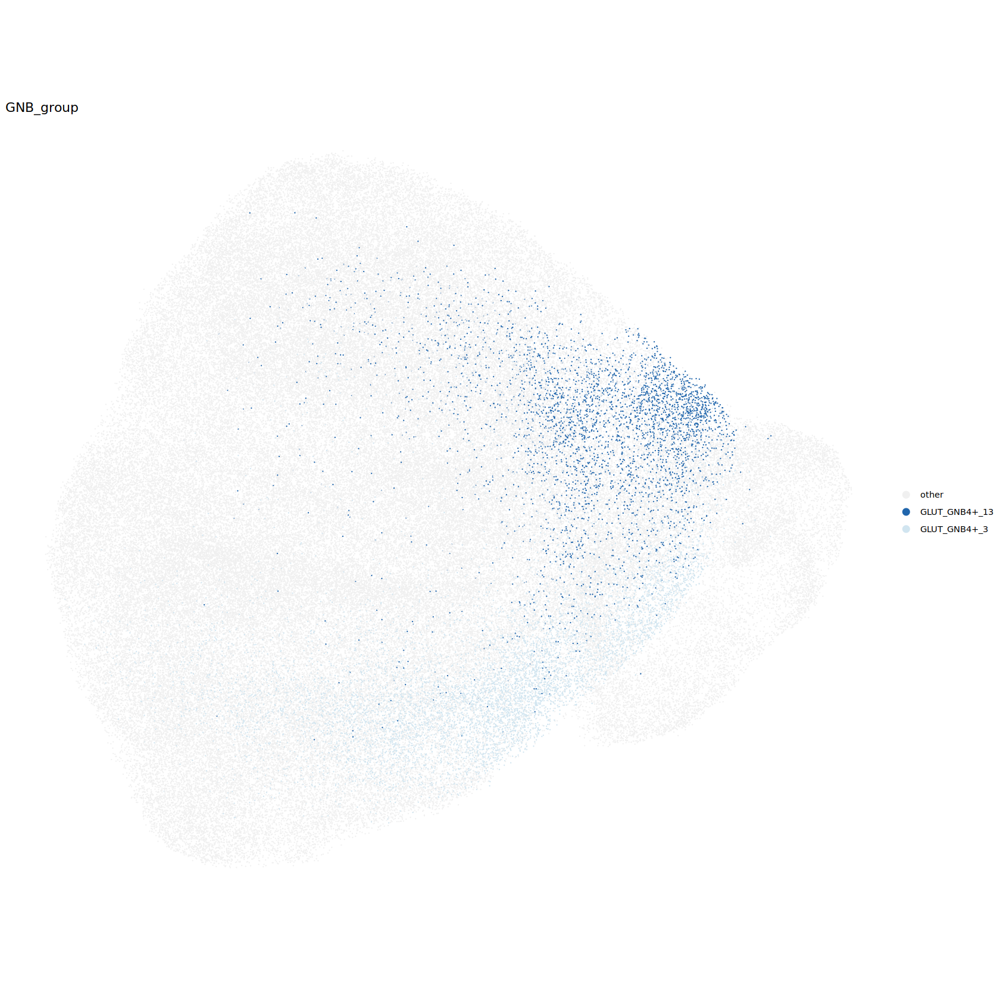

In [19]:
classFiltSeurat$GNB_group='other'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$macaque_Cluster %in% c('GLUT_GNB4+_13'),]$GNB_group='GLUT_GNB4+_13'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$macaque_Cluster %in% c('GLUT_GNB4+_3'),]$GNB_group='GLUT_GNB4+_3'

col=c('#F0F0F0',brewer.pal(6,'RdBu')[c(6,4)])
names(col)=c('other','GLUT_GNB4+_13','GLUT_GNB4+_3')
options(repr.plot.width=14, repr.plot.height=14)
DimPlot(classFiltSeurat, reduction="umap", group.by="GNB_group",label=F,raster=FALSE,cols = col)+coord_fixed()+NoLegend()+theme_void()



In [30]:
classFiltSeurat$clusterNameMod='test'
classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='marmoset',]$clusterNameMod=paste0('marmoset_',
                                                                                                classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='marmoset',]$marmoset_Cluster)
classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='mouse',]$clusterNameMod=paste0('mouse_',
                                                                                             classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='mouse',]$mouse_Cluster)
classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='macaque',]$clusterNameMod=paste0('macaque_',
                                                                                               classFiltSeurat@meta.data[classFiltSeurat@meta.data$species=='macaque',]$macaque_Cluster)




In [21]:

reorder_matrix <- function(matrix1, by.rows = TRUE) {
  if (by.rows == TRUE) {
    conf.order <- order(apply(matrix1, 1, which.max))
    matrix1.reordered <- matrix1[conf.order, ]
  } else {
    conf.order <- order(apply(matrix1, 2, which.max))
    matrix1.reordered <- matrix1[, conf.order]
  }
}

compare_cl <- function(cl, ref.cl,
                       plot.title = NA, plot.silent = TRUE,
                       heat.colors = colorRampPalette(c("white", "grey70", "black"))(100),
                       row.cl.num = min(length(unique(cl)),
                                        length(unique(ref.cl)))) {
  library(grid)
  library(pheatmap)
  
  conf1 <- table(cl, ref.cl) # a count table with cl as row and ref.cl as column
  conf1 <- sweep(conf1, 1, rowSums(conf1), "/") # make the sum of each row = 1, the ratio of one cl related to each ref.cl
  conf2 <- reorder_matrix(conf1) # order the matrix to put high value to the diagonal
  
  # Cluster co-occurence
  cl.prop.cocl <- apply(conf1, 2, function(x) {
    grid1 <- expand.grid(x, x) # 一个完全展开的2列data.frame
    min.prop <- apply(grid1, 1, min)
  })
  
  cl.prop.cocl.total <- apply(cl.prop.cocl, 1, sum)
  cl.prop.cocl.m <- matrix(cl.prop.cocl.total, nrow(conf1), nrow(conf1),
                           dimnames = list(rownames(conf1), rownames(conf1)))
  # cl.prop.cocl.m 记录了cl中任意两类之间的共聚类的比例,取的是最小值之和,个人觉得这个计算方法很奇怪
  ph1 <- pheatmap(conf2, cutree_rows = row.cl.num, clustering_method = "ward.D2",
                  # annotation_row = ref.cl.anno[, -grep("cluster_label", colnames(ref.cl.anno))],
                  color = heat.colors, fontsize = 6,
                  main = plot.title, silent = plot.silent)
  return(list(conf = conf2, cocl = cl.prop.cocl.m, ph = ph1))
}

save_pheatmap_pdf <- function(x, filename, width=120, height=24) {
  stopifnot(!missing(x))
  stopifnot(!missing(filename))
  pdf(filename, width=width, height=height)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}

options(scipen=200)


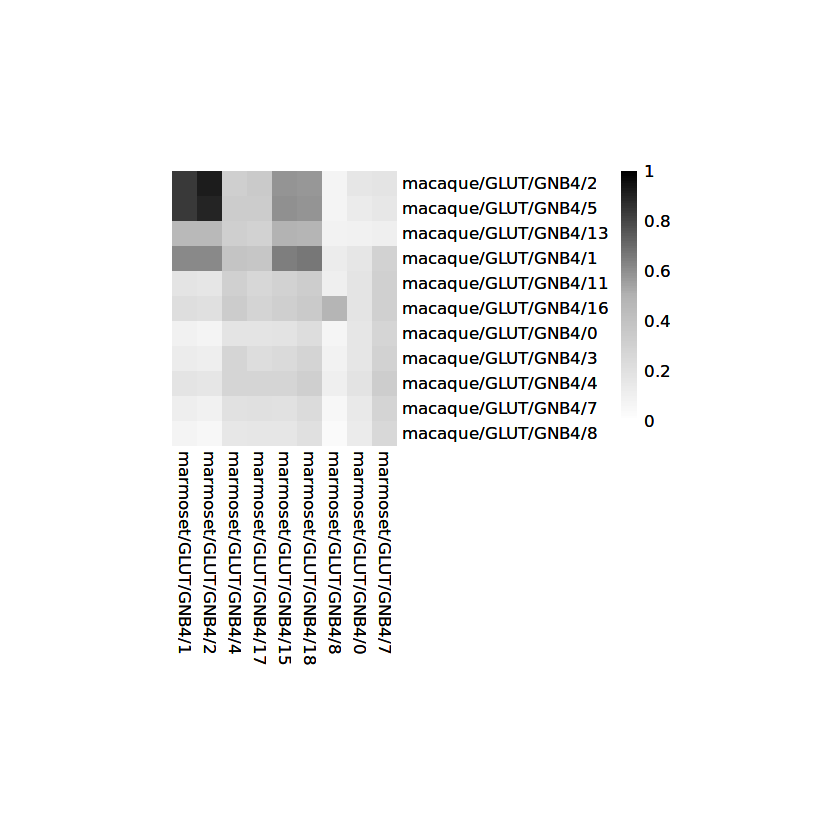

In [38]:
integrateSeurat=classFiltSeurat
integrateSeurat$clusterNameMod=gsub('__','-_',integrateSeurat$clusterNameMod)

cl.conf <- compare_cl(integrateSeurat$clusterNameMod, integrateSeurat$seurat_clusters)
cocl <- cl.conf$cocl

cocl.subset <- cocl[grepl("macaque", row.names(cocl)),
                    grepl("marm", row.names(cocl))]
# order row by hclust
tmpDist = as.dist(1-cor(t(cocl.subset)))
tmpDist[is.na(tmpDist)]=0
ordRow = hclust(tmpDist)$order
tmpDist = as.dist(1-cor(cocl.subset))
tmpDist[is.na(tmpDist)]=0
ordCol = hclust(tmpDist)$order

cocl.subset = cocl.subset[, ordCol]
cocl.subset = reorder_matrix(cocl.subset, by.rows=T)
all_n=rownames(cocl.subset)
ex_n=all_n[grep('GLUT',all_n)]
in_n=all_n[grep('GABA',all_n)]
non_n1=in_n[grep('PV',in_n)]
non_n2=in_n[grep('SST',in_n)]
non_n3=in_n[grep('CHC',in_n)]
non_n4=in_n[grep('RELN',in_n)]
non_n5=in_n[grep('VIP',in_n)]
non_n6=in_n[grep('LAMP',in_n)]
non_n7=in_n[grep('DRD',in_n)]
in_n=c(non_n1,non_n2,non_n3,non_n4,non_n5,non_n6,non_n7)
non_n=setdiff(all_n,c(ex_n,in_n))

cocl.subset1=cocl.subset[c(ex_n,in_n,non_n),]


cocl.subset1 = reorder_matrix(cocl.subset1, by.rows=F)

options(repr.plot.width=7, repr.plot.height=7)

heat.colors <- colorRampPalette(c("white", "grey70", "black"))(100)
df1=cocl.subset1
rownames(cocl.subset1)=gsub('\\+','',gsub('_','\\/',rownames(cocl.subset1)))
colnames(cocl.subset1)=gsub('\\+','',gsub('_','\\/',colnames(cocl.subset1)))


gp1=pheatmap(cocl.subset1, breaks=seq(0, 1, 0.01), cluster_rows = F, cluster_cols = F,
         #annotation_col = df_row,annotation_row = df_col,annotation_colors=ann_colors,
         color = heat.colors, border_color = NA,
         fontsize = 10, cellwidth=15, cellheight=15) 
gp1



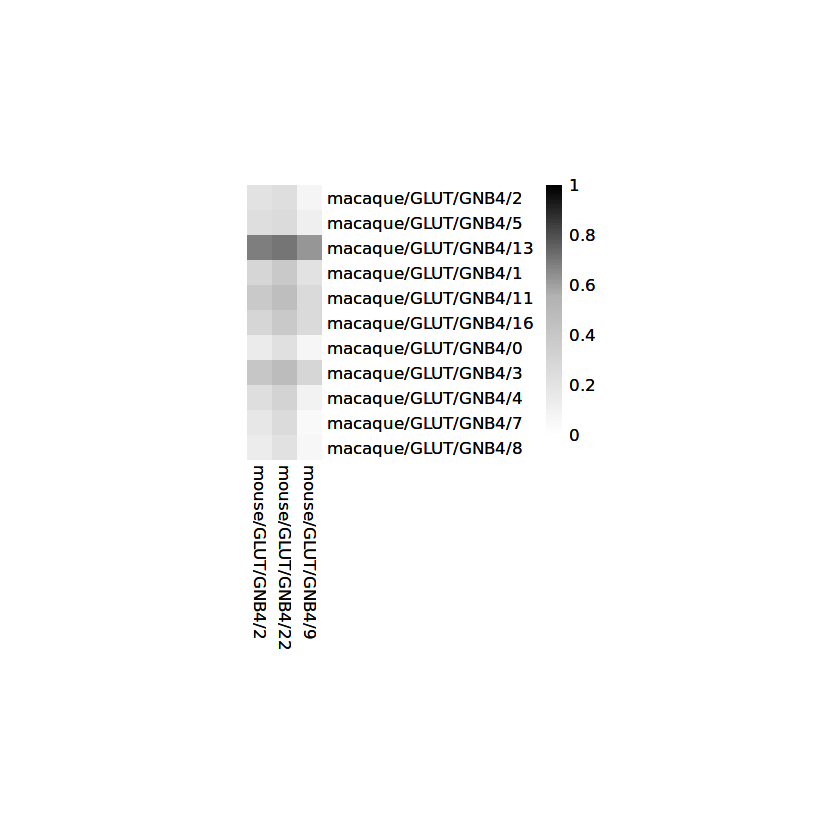

In [39]:
integrateSeurat=classFiltSeurat
cl.conf <- compare_cl(integrateSeurat$clusterNameMod, integrateSeurat$seurat_clusters)
cocl <- cl.conf$cocl

cocl.subset <- cocl[grepl("macaque", row.names(cocl)),
                    grepl("mouse", row.names(cocl))]
# order row by hclust
tmpDist = as.dist(1-cor(t(cocl.subset)))
tmpDist[is.na(tmpDist)]=0
ordRow = hclust(tmpDist)$order
tmpDist = as.dist(1-cor(cocl.subset))
tmpDist[is.na(tmpDist)]=0
ordCol = hclust(tmpDist)$order

cocl.subset = cocl.subset[rownames(df1), ]
cocl.subset = reorder_matrix(cocl.subset, by.rows=F)
all_n=rownames(cocl.subset)
ex_n=all_n[grep('GLUT',all_n)]
in_n=all_n[grep('GABA',all_n)]
non_n1=in_n[grep('PV',in_n)]
non_n2=in_n[grep('SST',in_n)]
non_n3=in_n[grep('CHC',in_n)]
non_n4=in_n[grep('RELN',in_n)]
non_n5=in_n[grep('VIP',in_n)]
non_n6=in_n[grep('LAMP',in_n)]
non_n7=in_n[grep('DRD',in_n)]
in_n=c(non_n1,non_n2,non_n3,non_n4,non_n5,non_n6,non_n7)
non_n=setdiff(all_n,c(ex_n,in_n))

cocl.subset1=cocl.subset[c(ex_n,in_n,non_n),]


cocl.subset1 = reorder_matrix(cocl.subset1, by.rows=F)

options(repr.plot.width=7, repr.plot.height=7)

heat.colors <- c(colorRampPalette(c("white", "grey70"))(55), colorRampPalette(c("grey70", "black"))(45))
df1=cocl.subset1

rownames(cocl.subset1)=gsub('\\+','',gsub('_','\\/',rownames(cocl.subset1)))
colnames(cocl.subset1)=gsub('\\+','',gsub('_','\\/',colnames(cocl.subset1)))


gp2=pheatmap(cocl.subset1, breaks=seq(0, 1, 0.01), cluster_rows = F, cluster_cols = F,
         #annotation_col = df_row,annotation_row = df_col,annotation_colors=ann_colors,
         color = heat.colors, border_color = NA,
         fontsize = 10, cellwidth=15, cellheight=15) 
gp2



In [40]:
save_pheatmap_pdf <- function(x, filename, width=15, height=15) {
  stopifnot(!missing(x))
  stopifnot(!missing(filename))
  pdf(filename, width=width, height=height)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}
save_pheatmap_pdf(gp1,"/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/heat_gnb1.pdf",7,7)

save_pheatmap_pdf(gp2,"/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig6_renew_240307_LHX6/heat_gnb2.pdf",7,7)


png 
  2

png 
  2

In [11]:
unique(classFiltSeurat$species)

[1] "mouse"    "marmoset" "macaque"

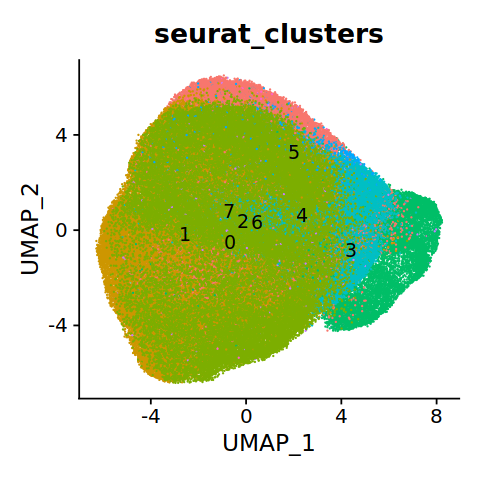

In [17]:

DimPlot(classFiltSeurat, reduction="umap", group.by="seurat_clusters",label=T,raster=FALSE)+coord_fixed()+NoLegend()


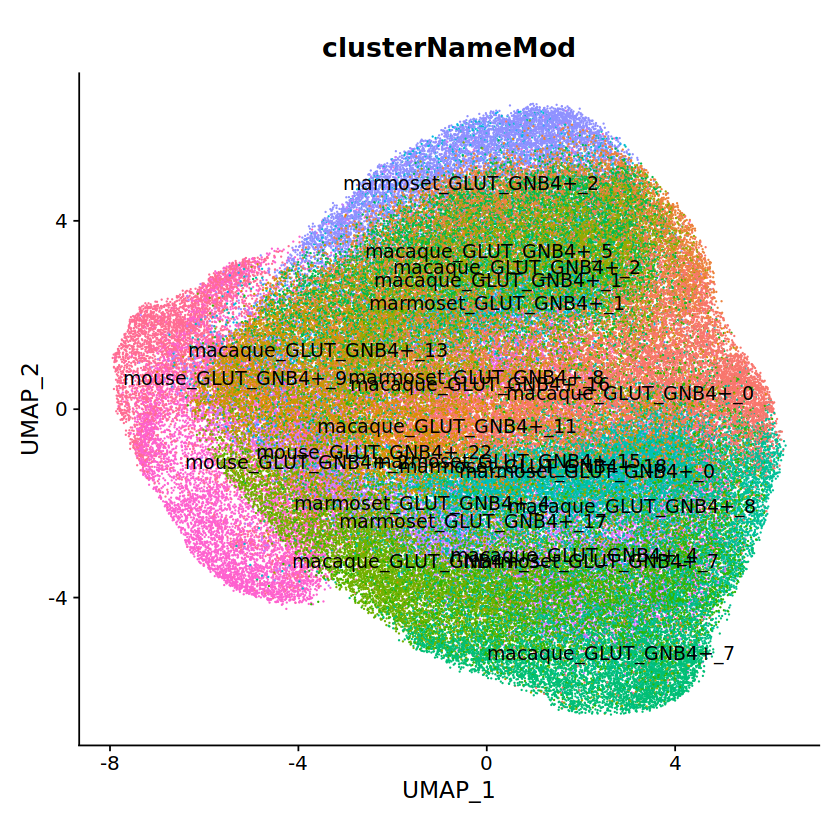

In [139]:
DimPlot(classFiltSeurat, reduction="umap", group.by="clusterNameMod",label=T,raster=FALSE)+coord_fixed()+NoLegend()


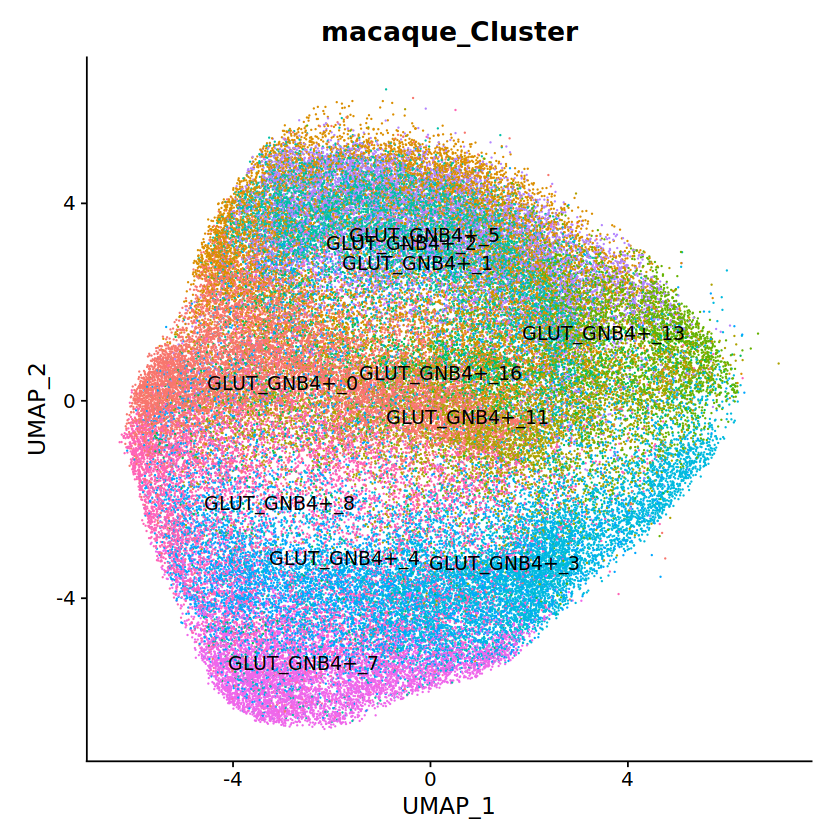

In [122]:
sub_classFiltSeurat1=subset(classFiltSeurat,species=='macaque')

DimPlot(sub_classFiltSeurat1, reduction="umap", group.by="macaque_Cluster",label=T,raster=FALSE)+coord_fixed()+NoLegend()




In [41]:
sub_classFiltSeurat1$GNB_group='other'
sub_classFiltSeurat1@meta.data[sub_classFiltSeurat1@meta.data$macaque_Cluster %in% c('GLUT_GNB4+_13','GLUT_GNB4+_3'),]$GNB_group='like_mouse'
col=c('#F0F0F0','red')
names(col)=c('other','like_mouse')



In [43]:
unique(sub_classFiltSeurat1$GNB_group)

[1] "other"      "like_mouse"

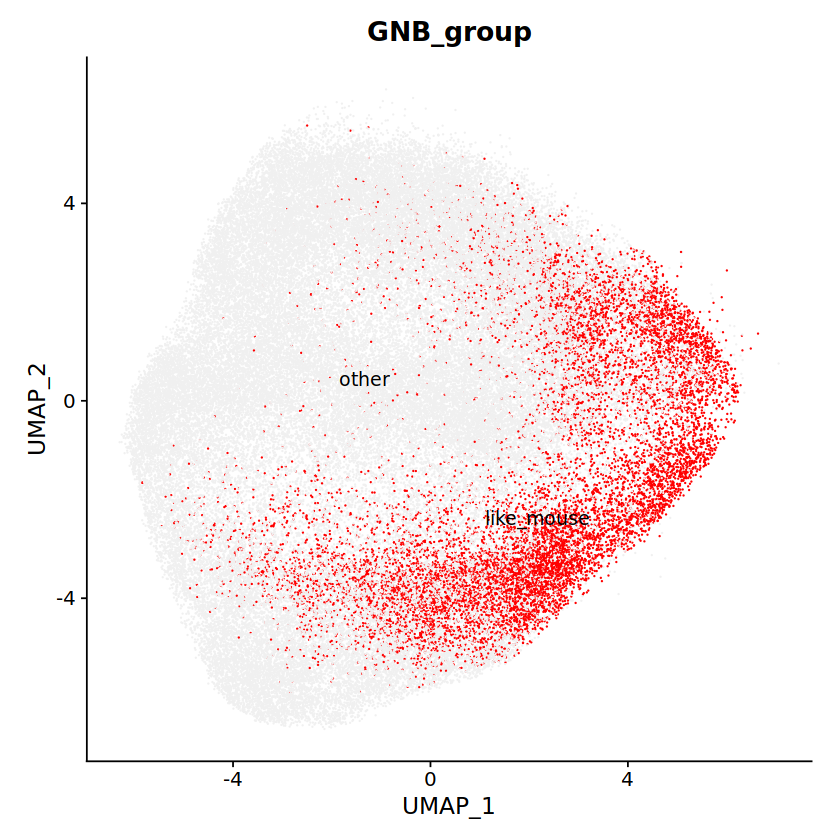

In [46]:

DimPlot(sub_classFiltSeurat1, reduction="umap", group.by="GNB_group",label=T,raster=FALSE,cols = col)+coord_fixed()+NoLegend()



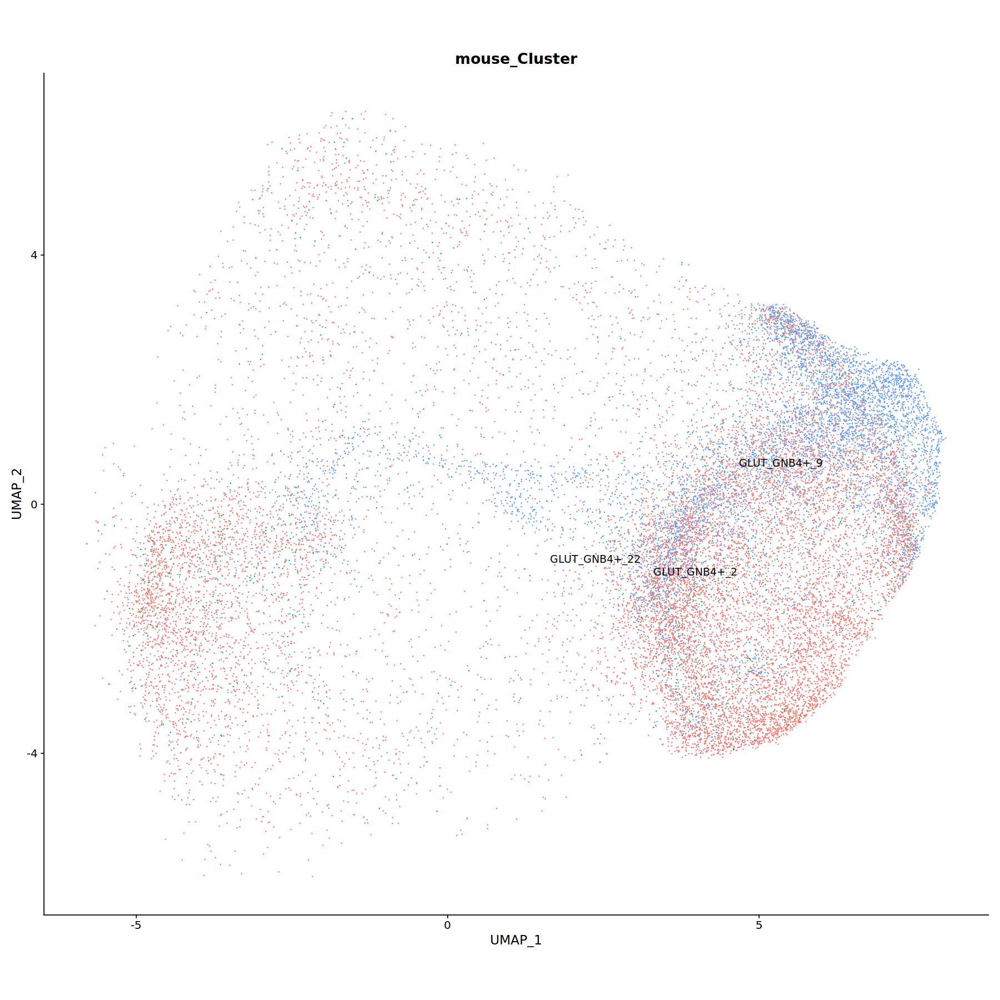

In [47]:
options(repr.plot.width=15, repr.plot.height=15)
sub_classFiltSeurat=subset(classFiltSeurat,species=='mouse')
DimPlot(sub_classFiltSeurat, reduction="umap", group.by="mouse_Cluster",label=T,raster=FALSE)+coord_fixed()+NoLegend()


